# Task 2a - Traffic Sign Detection by Matthias Ellul

**Model (Framework 1):** Ultralytics YOLOv8 (PyTorch)

Goal: train an object detector to detect *traffic sign type* from images using the consolidated COCO annotations in `COCO.json`.

This notebook:
1. Converts `COCO.json` → YOLO format (images/labels + `data.yaml`)
2. Trains YOLOv8
3. Evaluates (mAP, PR curves) + qualitative inference
4. Produces **per-image analytics**: number of signs detected + sign types

> Note: To run the notebook, dataset paths needs to be changed since the repo structure had to be modified to align with submission requirements.


In [2]:
from pathlib import Path
import json
from collections import defaultdict
import random

# Root directory (notebook location)
ROOT_DIR = Path(".").resolve()

# Outputs directory
OUTPUTS_DIR = ROOT_DIR / "Outputs"
COCO_ALL = OUTPUTS_DIR / 'COCO.json'
IMG_DIR = OUTPUTS_DIR / 'images'

assert COCO_ALL.exists(), f"Missing {COCO_ALL}"
assert IMG_DIR.exists(), f"Missing {IMG_DIR}"

coco = json.loads(COCO_ALL.read_text(encoding='utf-8'))

images = coco['images']
anns = coco['annotations']
cats = coco['categories']

cat_id_to_idx = {c['id']: i for i, c in enumerate(sorted(cats, key=lambda x: x['id']))}
idx_to_name = {i: c['name'] for i, c in enumerate(sorted(cats, key=lambda x: x['id']))}

img_by_id = {im['id']: im for im in images}
anns_by_img = defaultdict(list)
for a in anns:
    anns_by_img[a['image_id']].append(a)

print('images:', len(images), '\nannotations:', len(anns), '\nclasses:', len(idx_to_name))


images: 620 
annotations: 654 
classes: 11


In [3]:
# Train/val split
from sklearn.model_selection import train_test_split

img_ids = sorted(img_by_id.keys())
train_ids, val_ids = train_test_split(img_ids, test_size=0.2, random_state=42)
train_ids, val_ids = set(train_ids), set(val_ids)

print('train:', len(train_ids), '\nval:', len(val_ids))


train: 496 
val: 124


In [6]:
# Convert COCO boxes to YOLO labels
import shutil

OUT = Path('yolo_sign_type')
for sub in ['images/train', 'images/val', 'labels/train', 'labels/val']:
    (OUT / sub).mkdir(parents=True, exist_ok=True)

def coco_bbox_to_yolo(bbox, W, H):
    x, y, w, h = bbox
    cx = x + w / 2.0
    cy = y + h / 2.0
    return cx / W, cy / H, w / W, h / H

missing = 0
for img_id, rec in img_by_id.items():
    src_img = IMG_DIR / rec['file_name']
    if not src_img.exists():
        missing += 1
        continue

    split_name = 'train' if img_id in train_ids else 'val'
    dst_img = OUT / 'images' / split_name / rec['file_name']
    dst_lbl = OUT / 'labels' / split_name / (Path(rec['file_name']).stem + '.txt')

    dst_img.parent.mkdir(parents=True, exist_ok=True)
    dst_lbl.parent.mkdir(parents=True, exist_ok=True)

    shutil.copy2(src_img, dst_img)

    W, H = rec['width'], rec['height']
    lines = []
    for ann in anns_by_img.get(img_id, []):
        cls = cat_id_to_idx[ann['category_id']]
        cx, cy, w, h = coco_bbox_to_yolo(ann['bbox'], W, H)
        cx, cy, w, h = [max(0.0, min(1.0, v)) for v in (cx, cy, w, h)]
        lines.append(f"{cls} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}")

    dst_lbl.write_text("".join(lines), encoding='utf-8')

print('Missing images:', missing)

yaml_text = "\n".join([
    f"path: {OUT.as_posix()}",
    "train: images/train",
    "val: images/val",
    "",
    f"nc: {len(idx_to_name)}",
    "names:",
] + [f"  - {idx_to_name[i]}" for i in range(len(idx_to_name))])

(OUT / 'data.yaml').write_text(yaml_text, encoding='utf-8')
print('Wrote', OUT / 'data.yaml')

Missing images: 0
Wrote yolo_sign_type\data.yaml


In [9]:
from pathlib import Path
from PIL import Image, UnidentifiedImageError

def remove_corrupt_images(images_dir: Path, exts=(".jpg", ".jpeg", ".png")):
    bad = []
    for p in images_dir.rglob("*"):
        if p.suffix.lower() not in exts:
            continue
        try:
            with Image.open(p) as im:
                im.verify()  # fast integrity check
        except (UnidentifiedImageError, OSError, ValueError):
            bad.append(p)

    if bad:
        print(f"Found {len(bad)} corrupt/unreadable images in {images_dir}. Removing them...")
        for p in bad:
            try:
                p.unlink()
            except Exception as e:
                print(f"  Could not delete {p}: {e}")
    else:
        print(f"No corrupt images found in {images_dir}.")

    return bad

# Example: run on the YOLO dataset folders you generated
bad_train = remove_corrupt_images(Path("yolo_sign_type/images/train"))
bad_val   = remove_corrupt_images(Path("yolo_sign_type/images/val"))
print(f"Removed total: {len(bad_train) + len(bad_val)}")

Found 117 corrupt/unreadable images in yolo_sign_type\images\train. Removing them...
Found 33 corrupt/unreadable images in yolo_sign_type\images\val. Removing them...
Removed total: 150


In [1]:
# Train YOLOv8
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
results = model.train(
    data="yolo_sign_type/data.yaml",
    epochs=50,        # more convergence
    imgsz=512,        # better small-object localisation
    batch=8,
    device="cpu",
    workers=2,
    patience=20,      # stop if not improving
    lr0=0.005,        # slightly lower for stability on small datasets
    cos_lr=True,      # smoother LR decay
    verbose=False,
    plots=True
)

New https://pypi.org/project/ultralytics/8.4.4 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.235  Python-3.10.19 torch-2.4.1 CPU (Intel Core i5-1035G1 1.00GHz)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=yolo_sign_type/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimi

In [ ]:
# Quantitative evaluation on val split
import io
import contextlib
import pandas as pd
import numpy as np

# Run validation quietly (capture console output)
buf = io.StringIO()
with contextlib.redirect_stdout(buf), contextlib.redirect_stderr(buf):
    metrics = model.val(
        data="yolo_sign_type/data.yaml",
        split="val",
        verbose=False,   # reduces extra chatter
        plots=True       # keeps PR curves, confusion matrix, etc.
    )

raw_log = buf.getvalue()

# Print only the important lines from the log 
# Keep: warnings + the metrics table + speed line + save dir
keep_lines = []
for line in raw_log.splitlines():
    if (
        "WARNING" in line
        or line.strip().startswith("Class")
        or line.strip().startswith("all")
        or "Speed:" in line
        or "Results saved to" in line
        or "Box(P" in line
    ):
        keep_lines.append(line)

print("\n".join(keep_lines))

# Make a clean summary table (overall + per-class)
names = metrics.names  # dict {class_id: name}
map_per_class = metrics.maps  # per-class mAP50-95
n_instances = metrics.nt_per_class  # instances per class in val

rows = []
for i, name in names.items():
    rows.append({
        "class_id": i,
        "class": name,
        "instances_val": int(n_instances[i]) if i < len(n_instances) else None,
        "mAP50-95": float(map_per_class[i]) if i < len(map_per_class) else None
    })

df = pd.DataFrame(rows).sort_values("mAP50-95", ascending=False)

print("\nOverall metrics:")
print(f"Precision:  {metrics.results_dict['metrics/precision(B)']:.3f}")
print(f"Recall:     {metrics.results_dict['metrics/recall(B)']:.3f}")
print(f"mAP@50:     {metrics.results_dict['metrics/mAP50(B)']:.3f}")
print(f"mAP@50-95:  {metrics.results_dict['metrics/mAP50-95(B)']:.3f}")

# TP/FP/FN from Ultralytics confusion matrix (detection-style)
cm = np.array(metrics.confusion_matrix.matrix)  # (nc+1, nc+1), last index = background
nc = cm.shape[0] - 1
bg = nc

TP = int(np.trace(cm[:nc, :nc]))
FP = int(cm[bg, :nc].sum())
FN = int(cm[:nc, bg].sum())

print("\nCounts at val() matching settings (IoU-based):")
print(f"TP: {TP}")
print(f"FP: {FP}")
print(f"FN: {FN}")

display(df.style.format({"mAP50-95": "{:.3f}"}))


Ultralytics 8.3.235  Python-3.10.19 torch-2.4.1 CPU (Intel Core i5-1035G1 1.00GHz)


val: Fast image access  (ping: 0.20.1 ms, read: 340.3168.6 MB/s, size: 1773.7 KB)
WARNING Box and segment counts should be equal, but got len(segments) = 5, len(boxes) = 91. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                   all         91         91      0.724        0.7      0.724      0.586
Speed: 1.9ms preprocess, 67.6ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to C:\Users\matth\OneDrive\Documents\UM\Advanced Computer Vision for AI\Group Project\runs\detect\val2
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 17% ━━────────── 1/6 14.5s/it 4.3s<1:12
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 33% ━━━━──────── 2/6 8.7s/it 8.9s<34.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 50% ━━━━━━───

,class_id,class,instances_val,mAP50-95
7,7,Pedestrian_Crossing,3,0.888
3,3,No Through Road (T-Sign),5,0.881
8,8,Roundabout Ahead,7,0.809
2,2,No Through Road,3,0.713
4,4,No_Entry,8,0.703
1,1,No Entry (One Way),11,0.672
10,10,Stop,32,0.632
6,6,Pedestrian Crossing,15,0.603
0,0,Blind-Spot Mirror (Convex),5,0.462
5,5,No_Through_Road,1,0.081


Evaluation plots from final test run:


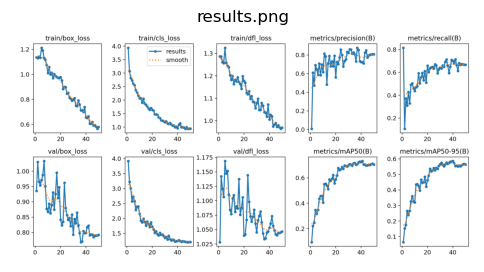

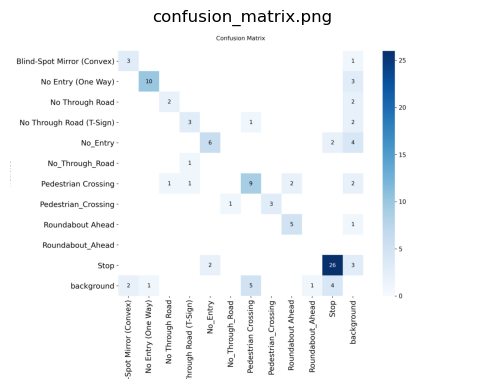

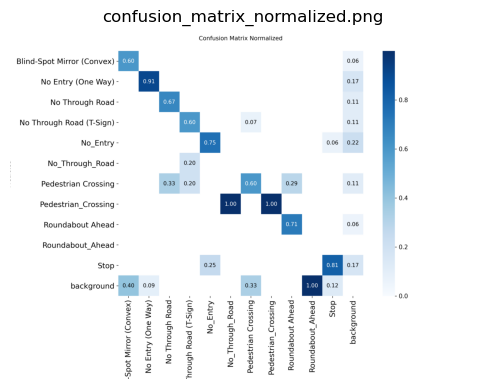

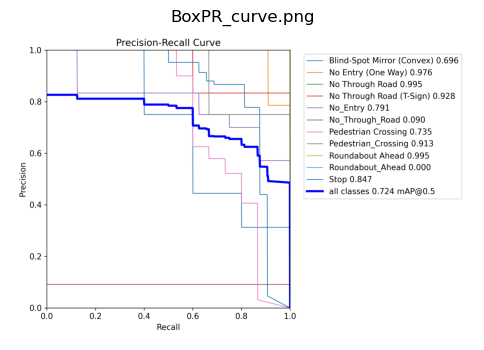

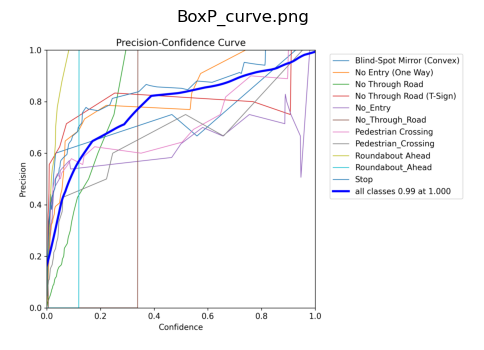

...

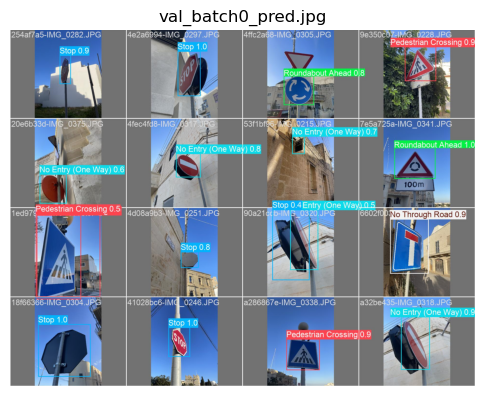

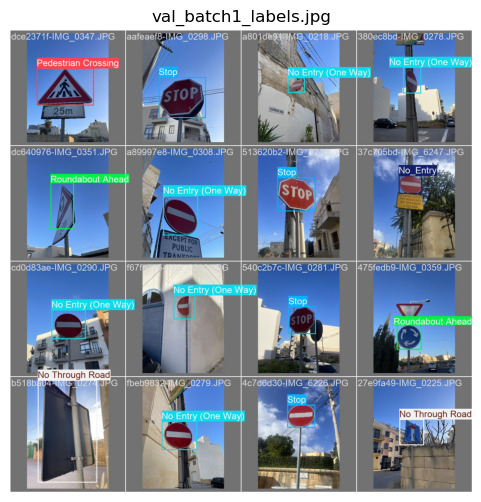

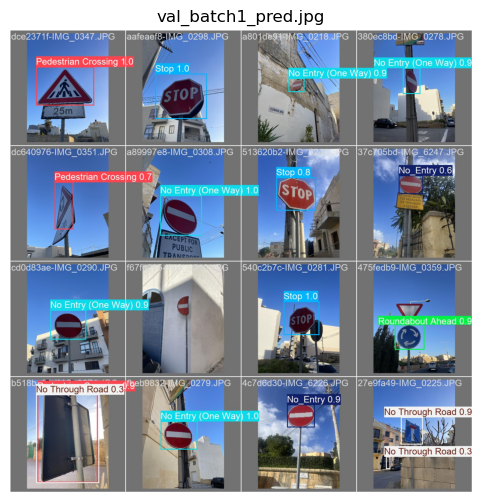

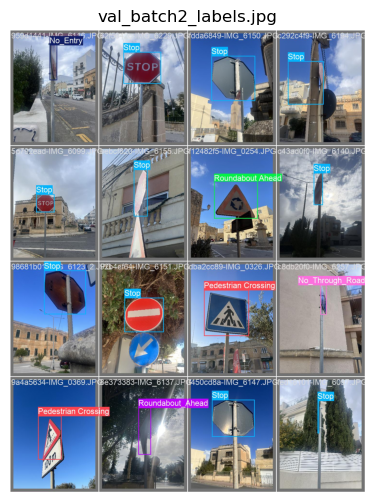

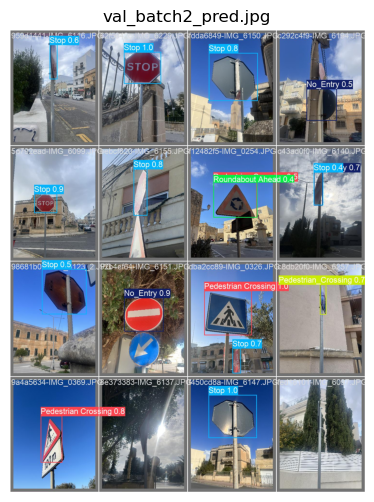

In [9]:
# Visualise evaluation plots

from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

print("Evaluation plots from final test run:")

RUN_DIR = Path("runs/detect/train2")

for name in [
    "results.png",
    "confusion_matrix.png",
    "confusion_matrix_normalized.png",
    "BoxPR_curve.png",
    "BoxP_curve.png",
    "BoxR_curve.png",
    "BoxF1_curve.png",
    "val_batch0_labels.jpg",
    "val_batch0_pred.jpg",
    "val_batch1_labels.jpg",
    "val_batch1_pred.jpg",
    "val_batch2_labels.jpg",
    "val_batch2_pred.jpg",
]:
    img_path = RUN_DIR / name
    if not img_path.exists():
        print(f"[SKIP] Missing: {img_path}")
        continue

    img = Image.open(img_path)
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.title(name)
    plt.show()

Found 620 image files, 470 readable.


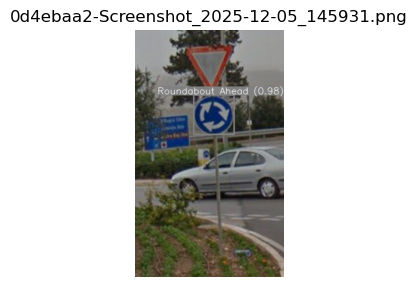

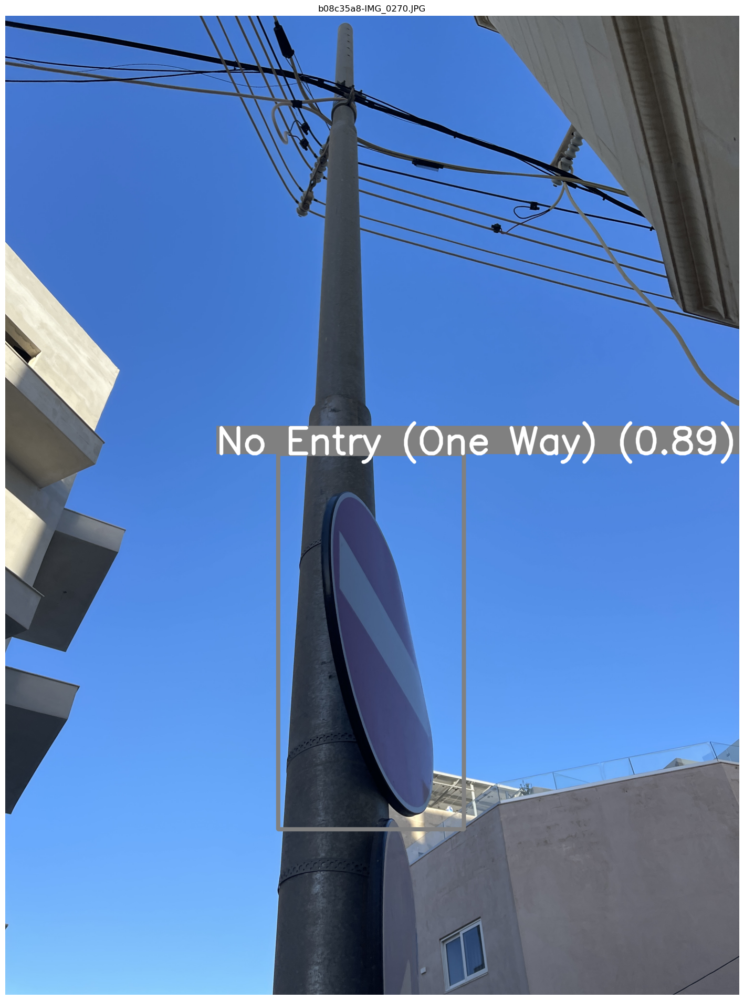

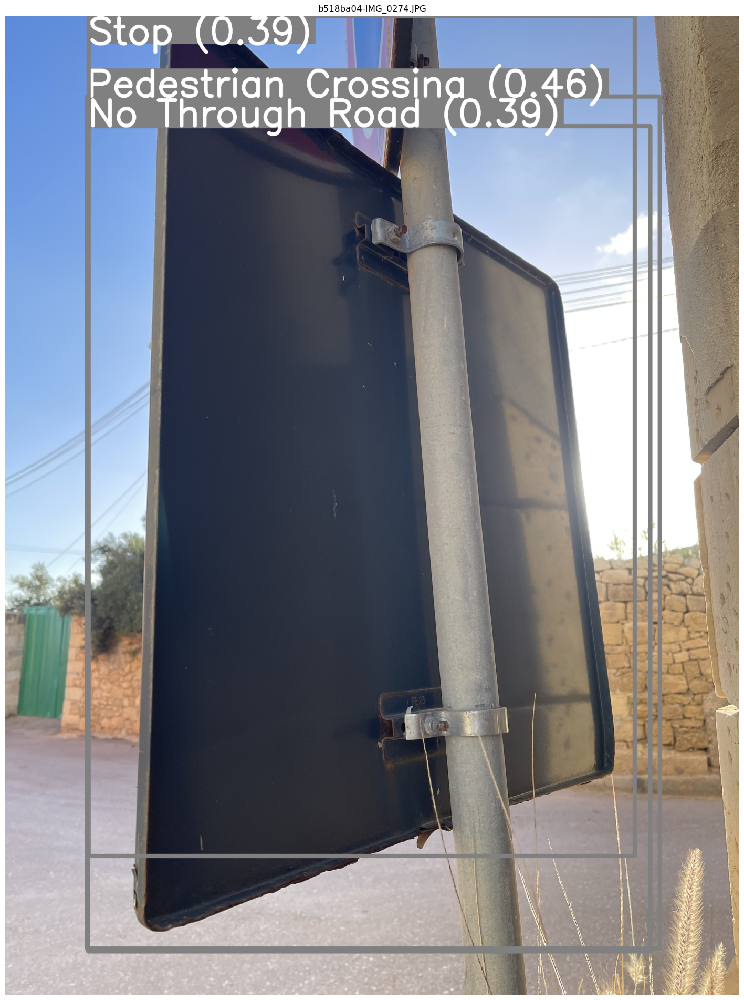

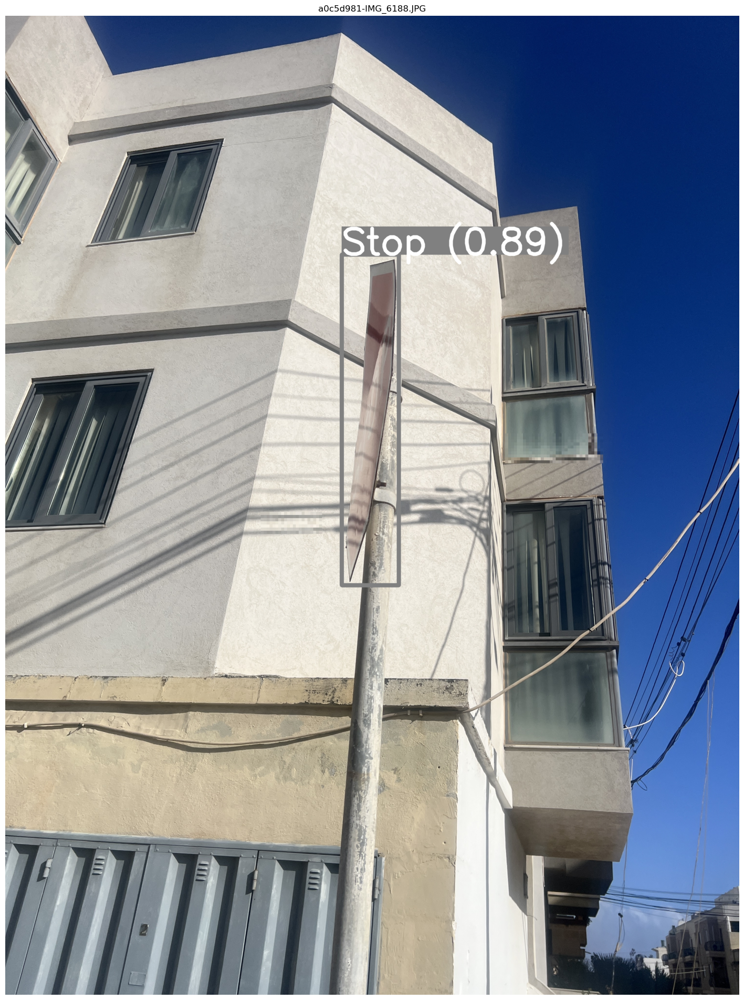

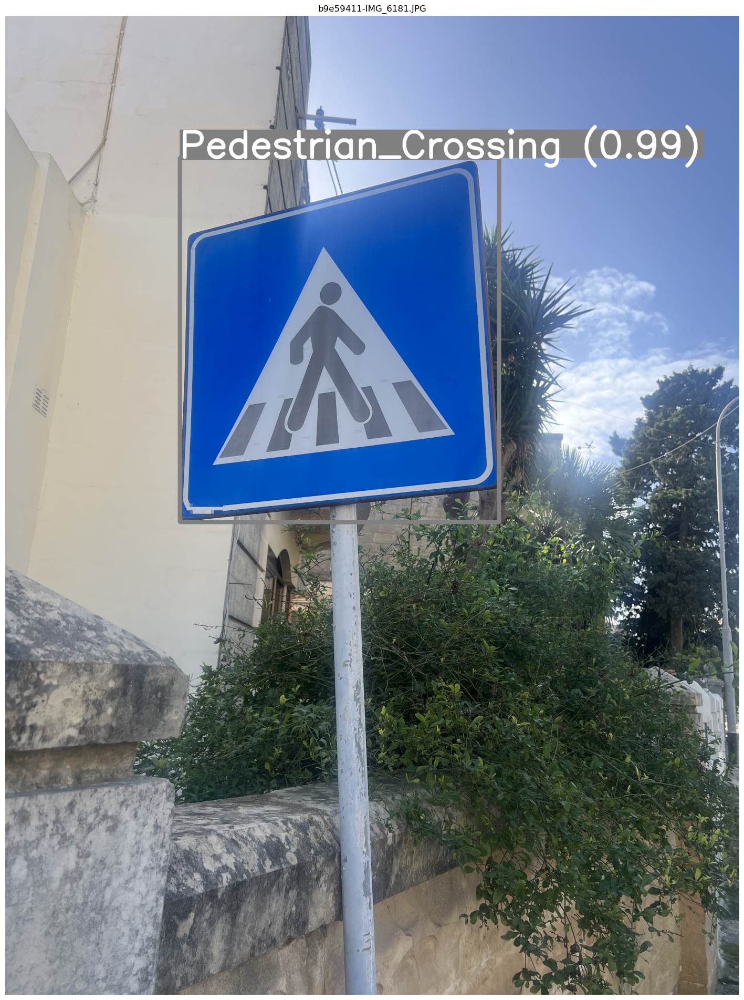

- 0d4ebaa2-Screenshot_2025-12-05_145931.png: 1 sign(s) detected | Predicted: Roundabout Ahead
- b08c35a8-IMG_0270.JPG: 1 sign(s) detected | Predicted: No Entry (One Way)
- b518ba04-IMG_0274.JPG: 3 sign(s) detected | Predicted: Pedestrian Crossing, No Through Road, Stop
- a0c5d981-IMG_6188.JPG: 1 sign(s) detected | Predicted: Stop
- b9e59411-IMG_6181.JPG: 1 sign(s) detected | Predicted: Pedestrian_Crossing


In [ ]:
# Qualitative inference + per-image analytics (maintenance-oriented)
from pathlib import Path
import random
from PIL import Image, UnidentifiedImageError
from ultralytics.utils.plotting import Annotator
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# Folder with images to run inference on
IMG_DIR = IMG_DIR if "IMG_DIR" in globals() else Path("Outputs/images")

# Class name lookup (YOLO training "names" dict)
name_map = getattr(model, "names", None) or globals().get("id2name_all", {})

def is_readable_image(p: Path) -> bool:
    """Fast check to avoid Ultralytics crashing on unreadable files."""
    try:
        with Image.open(p) as im:
            im.verify()
        return True
    except (FileNotFoundError, UnidentifiedImageError, OSError, ValueError):
        return False

# Gather candidate images
exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
all_imgs = [p for p in IMG_DIR.iterdir() if p.suffix.lower() in exts]

# Keep only readable images
good_imgs = [p for p in all_imgs if is_readable_image(p)]

print(f"Found {len(all_imgs)} image files, {len(good_imgs)} readable.")

# Sample a few for qualitative inspection
N = 5
sample = random.sample(good_imgs, k=min(N, len(good_imgs)))

per_image_analytics = []

for path in sample:
    # Run prediction
    preds = model.predict(source=str(path), conf=0.25, verbose=False)
    if not preds:
        print(f"[SKIP] Ultralytics returned no predictions for {path.name}")
        continue

    pred = preds[0]

    # Load image for visualisation
    img = cv2.imread(str(path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Dynamic scaling based on image size
    h, w = img.shape[:2]
    scale = max(h, w) / 800.0  # reference resolution
    line_w = int(max(2, round(3 * scale)))
    font_sz = float(max(0.6, 0.8 * scale))

    annotator = Annotator(
        img,
        line_width=line_w,
        font_size=font_sz
    )

    if pred.boxes is not None:
        for box in pred.boxes:
            cls_id = int(box.cls)
            label = name_map.get(cls_id, str(cls_id))
            conf = float(box.conf)

            annotator.box_label(
                box.xyxy.squeeze().tolist(),
                f"{label} ({conf:.2f})"
            )

    # Display image (also scale figure size)
    fig_scale = max(h, w) / 1000.0
    plt.figure(figsize=(8 * fig_scale, 6 * fig_scale))
    plt.imshow(annotator.result())
    plt.title(path.name)
    plt.axis("off")
    plt.show()

    # Extract classes
    if pred.boxes is not None and len(pred.boxes) > 0:
        cls_ids = pred.boxes.cls.cpu().numpy().astype(int).tolist()
        class_names = [name_map.get(i, str(i)) for i in cls_ids]
    else:
        cls_ids = []
        class_names = []

    # Maintenance-oriented summary
    per_image_analytics.append({
        "image": path.name,
        "num_signs_detected": len(cls_ids),
        "predicted_categories": class_names
    })

# Print analytics (maintenance-oriented)
for row in per_image_analytics:
    cats = row["predicted_categories"]
    cats_str = ", ".join(cats) if cats else "None"
    print(f"- {row['image']}: {row['num_signs_detected']} sign(s) detected | Predicted: {cats_str}")
